In [1]:
!pip install visualkeras

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.7/993.7 kB 21.7 MB/s eta 0:00:0000:01


In [2]:
import pickle
import visualkeras
from tqdm import tqdm
import numpy as np
import pandas as pd
import skimage
from skimage import io
import tifffile as tifi
from skimage.io import imread_collection
import albumentations as A
from IPython.display import SVG
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from PIL import Image, ImageFont
from collections import defaultdict
import os, re, sys, random, shutil, cv2

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import applications, optimizers
from tensorflow.keras.applications import VGG16, VGG19, DenseNet121, InceptionResNetV2, ResNet50, MobileNetV2
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.utils import model_to_dot, plot_model
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, CSVLogger, LearningRateScheduler

2024-02-26 19:39:54.072221: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-26 19:39:54.072357: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-26 19:39:54.225996: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# loading data


In [3]:
data_dir = "/kaggle/input/mumbai-satellite-data/Dataset/Prepared_Dataset"

train_images = os.path.join(data_dir, "train_images/")
train_masks = os.path.join(data_dir, "train_masks/")
val_images = os.path.join(data_dir, "val_images/")
val_masks = os.path.join(data_dir, "val_masks/")
test_images = os.path.join(data_dir, "test_images/")
test_masks = os.path.join(data_dir, "test_masks/")


In [4]:
import os
print('Number of images in training set: ', len(os.listdir(train_images+'train')))
print('Number of masks in training set: ', len(os.listdir(train_masks+'train')))
print('Number of images in validation set: ', len(os.listdir(val_images+'valid')))
print('Number of masks in validation set: ', len(os.listdir(val_masks+'valid')))
print('Number of images in testing set: ', len(os.listdir(test_images+'test')))
print('Number of masks in testing set: ', len(os.listdir(test_masks+'test')))

Number of images in training set:  7128
Number of masks in training set:  7128
Number of images in validation set:  891
Number of masks in validation set:  891
Number of images in testing set:  891
Number of masks in testing set:  891


# plotting satellite images vs ground truth images


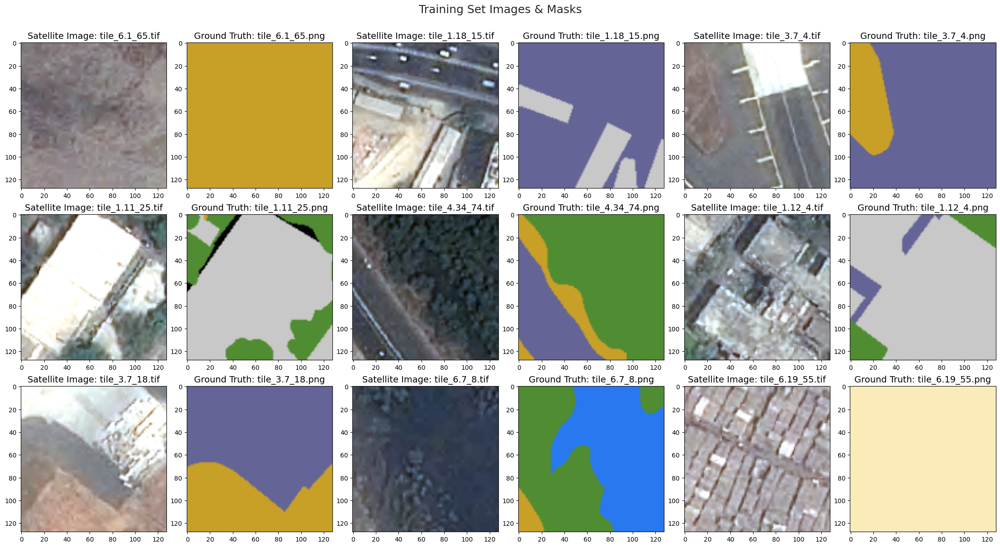

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
import cv2

files = ['tile_6.1_65', 'tile_1.18_15', 'tile_3.7_4', 'tile_1.11_25', 'tile_4.34_74', 'tile_1.12_4', 'tile_3.7_18', 'tile_6.7_8', 'tile_6.19_55']

def show_data(files, images_dir, masks_dir):
        fig, axs = plt.subplots(3, 6, figsize=(22, 12), constrained_layout=True)
        sns.set_style("ticks")
        fig.suptitle('Training Set Images & Masks\n', fontsize=18, fontweight='medium')
        idx = 0
        for i in range(3):
            for j in range(6):
                if j%2 == 0:
                    axs[i][j].imshow(cv2.resize(cv2.cvtColor(cv2.imread(f'{images_dir}train/{files[idx]}.tif'), cv2.COLOR_BGR2RGB),(128, 128)))
                    axs[i][j].set_title(f'Satellite Image: {files[idx]}.tif', fontdict = {'fontsize':14, 'fontweight':'medium'})
                    axs[i][j].grid(False)
                    axs[i][j].axis(True)
                elif j%2 != 0:
                        axs[i][j].imshow(cv2.resize(cv2.cvtColor(cv2.imread(f'{masks_dir}train/{files[idx]}.png'), cv2.COLOR_BGR2RGB),(128, 128)))
                        axs[i][j].set_title(f'Ground Truth: {files[idx]}.png', fontdict = {'fontsize':14, 'fontweight':'medium'})
                        axs[i][j].grid(False)
                        axs[i][j].axis(True)
                        idx += 1
                        
        plt.savefig('/kaggle/working/img1', facecolor= 'w', transparent= False, bbox_inches= 'tight', dpi= 300)
        plt.show()

show_data(files, train_images, train_masks)

In [6]:
import pandas as pd
class_df = pd.read_csv('/kaggle/input/mumbai-satellite-data/Dataset/Main_Dataset/class_dict.csv', index_col=False, skipinitialspace=True)
class_df

,name,r,g,b
0,Informal Settlements,250,235,185
1,Built-Up,200,200,200
2,Impervious Surfaces,100,100,150
3,Vegetation,80,140,50
4,Barren,200,160,40
5,Water,40,120,240
6,Unlabelled,0,0,0


In [7]:
import numpy as np
label_names= list(class_df.name)
label_codes = []
r= np.asarray(class_df.r)
g= np.asarray(class_df.g)
b= np.asarray(class_df.b)

for i in range(len(class_df)):
    label_codes.append(tuple([r[i], g[i], b[i]]))
    
label_codes, label_names

([(250, 235, 185),
  (200, 200, 200),
  (100, 100, 150),
  (80, 140, 50),
  (200, 160, 40),
  (40, 120, 240),
  (0, 0, 0)],
 ['Informal Settlements',
  'Built-Up',
  'Impervious Surfaces',
  'Vegetation',
  'Barren',
  'Water',
  'Unlabelled'])

In [8]:
code_to_id = {v:k for k,v in enumerate(label_codes)}
id_to_code = {k:v for k,v in enumerate(label_codes)}

name_to_id = {v:k for k,v in enumerate(label_names)}
id_to_name = {k:v for k,v in enumerate(label_names)}

name_to_code={label_names[i]:label_codes[i] for i in range(len(label_names))}

In [9]:
id_to_code

{0: (250, 235, 185),
 1: (200, 200, 200),
 2: (100, 100, 150),
 3: (80, 140, 50),
 4: (200, 160, 40),
 5: (40, 120, 240),
 6: (0, 0, 0)}

In [10]:
id_to_name

{0: 'Informal Settlements',
 1: 'Built-Up',
 2: 'Impervious Surfaces',
 3: 'Vegetation',
 4: 'Barren',
 5: 'Water',
 6: 'Unlabelled'}

In [11]:
name_to_code

{'Informal Settlements': (250, 235, 185),
 'Built-Up': (200, 200, 200),
 'Impervious Surfaces': (100, 100, 150),
 'Vegetation': (80, 140, 50),
 'Barren': (200, 160, 40),
 'Water': (40, 120, 240),
 'Unlabelled': (0, 0, 0)}

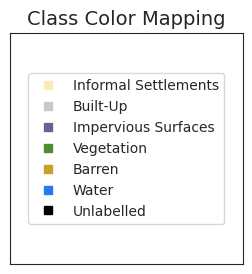

In [12]:

# Create a plot
fig, ax = plt.subplots(figsize=(3, 3))

# Plot each class color
for label, color in name_to_code.items():
    ax.plot([], [], 's', color=[c / 255. for c in color], label=label)

# Add legend
ax.legend(loc='center', fontsize=10)

# Remove ticks and labels
ax.set_xticks([])
ax.set_yticks([])
ax.set_xticklabels([])
ax.set_yticklabels([])

# # Add title
ax.set_title('Class Color Mapping', fontsize=14)

plt.show()

# One hot encoding and decoding


In [13]:
def rgb_to_onehot(rgb_image, color_map = id_to_code):
    '''Function to one hot encode RGB mask labels
        Inputs: 
            rgb_image - image matrix (e.g., 256 x 256 x 3 dimension numpy ndarray)
            color_map - dictionary of color to label id
        Output: One hot encoded image of dimensions (height x width x num_classes) where num_classes = len(color_map)
    '''
    num_classes = len(color_map)
    shape = rgb_image.shape[:2] + (num_classes,)
    encoded_image = np.zeros(shape, dtype=np.int8)
    for i, cls in enumerate(color_map):
        encoded_image[:,:,i] = np.all(rgb_image.reshape((-1, 3)) == color_map[i], axis=1).reshape(shape[:2])
    return encoded_image

def onehot_to_rgb(onehot, color_map = id_to_code):
    '''Function to decode encoded mask labels
        Inputs: 
            onehot - one hot encoded image matrix (height x width x num_classes)
            color_map - dictionary of color to label id
        Output: Decoded RGB image (height x width x 3) 
    '''
    single_layer = np.argmax(onehot, axis=-1)
    output = np.zeros(onehot.shape[:2] + (3,))
    for k in color_map.keys():
        output[single_layer==k] = color_map[k]
    return np.uint8(output)


In [14]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array

# Normalizing only frame images, since masks contain label info
data_gen_args = dict(rescale=1./255)
mask_gen_args = dict()

train_frames_datagen = ImageDataGenerator(**data_gen_args)
train_masks_datagen = ImageDataGenerator(**mask_gen_args)
val_frames_datagen = ImageDataGenerator(**data_gen_args)
val_masks_datagen = ImageDataGenerator(**mask_gen_args)
test_frames_datagen = ImageDataGenerator(**data_gen_args)
test_masks_datagen = ImageDataGenerator(**mask_gen_args)

# Seed defined for aligning images and their masks
seed = 1

# Image data Generators


In [15]:
# data_dir = "Dataset\Prepared_Dataset"

# train_images = os.path.join(data_dir, "train", "images")
# print(train_images)
# train_masks = os.path.join(data_dir, "train", "masks")
# val_images = os.path.join(data_dir, "val", "images")
# val_masks = os.path.join(data_dir, "val", "masks")
# test_images = os.path.join(data_dir, "test", "images")
# test_masks = os.path.join(data_dir, "test", "masks")


In [16]:
def TrainAugmentGenerator(train_images_dir, train_masks_dir, seed = 1, batch_size = 8, target_size = (512, 512)):
    '''Train Image data generator
        Inputs: 
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
            train_images_dir - train images directory
            train_masks_dir - train masks directory
            target_size - tuple of integers (height, width)
            
        Output: Decoded RGB image (height x width x 3) 
    '''
    train_image_generator = train_frames_datagen.flow_from_directory(
    train_images_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)

    train_mask_generator = train_masks_datagen.flow_from_directory(
    train_masks_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)

    while True:
        X1i = train_image_generator.next()
        X2i = train_mask_generator.next()
        
        #One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[0][x,:,:,:], id_to_code) for x in range(X2i[0].shape[0])]
        
        yield X1i[0], np.asarray(mask_encoded)

def ValAugmentGenerator(val_images_dir, val_masks_dir, seed = 1, batch_size = 8, target_size = (512, 512)):

    '''Validation Image data generator
        Inputs: 
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
            val_images_dir - validation images directory
            val_masks_dir - validation masks directory
            target_size - tuple of integers (height, width)
            
        Output: Decoded RGB image (height x width x 3) 
    '''
    val_image_generator = val_frames_datagen.flow_from_directory(
    val_images_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)


    val_mask_generator = val_masks_datagen.flow_from_directory(
    val_masks_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)


    while True:
        X1i = val_image_generator.next()
        X2i = val_mask_generator.next()
        
        #One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[0][x,:,:,:], id_to_code) for x in range(X2i[0].shape[0])]
        
        yield X1i[0], np.asarray(mask_encoded)
        
def TestAugmentGenerator(test_images_dir, test_masks_dir, seed = 1, batch_size = 8, target_size = (512, 512)):
    '''Validation Image data generator
        Inputs: 
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
            test_images_dir - testing images directory
            test_masks_dir - testing masks directory
            target_size - tuple of integers (height, width)
            
        Output: Decoded RGB image (height x width x 3) 
    '''
    test_image_generator = test_frames_datagen.flow_from_directory(
    test_images_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)


    test_mask_generator = test_masks_datagen.flow_from_directory(
    test_masks_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)


    while True:
        X1i = test_image_generator.next()
        X2i = test_mask_generator.next()
        
        #One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[0][x,:,:,:], id_to_code) for x in range(X2i[0].shape[0])]
        
        yield X1i[0], np.asarray(mask_encoded)

# DeepLabV3+


In [17]:
batch_size = 32
num_train_samples = len(np.sort(os.listdir(train_images+'train')))
num_val_samples = len(np.sort(os.listdir(val_images+'valid')))
steps_per_epoch = np.ceil(float(num_train_samples) / float(batch_size))
print('steps_per_epoch: ', steps_per_epoch)
validation_steps = np.ceil(float(num_val_samples) / (float(batch_size)))
print('validation_steps: ', validation_steps)

steps_per_epoch:  223.0
validation_steps:  28.0


In [18]:
from tensorflow.keras import backend as K
def dice_coef(y_true, y_pred):
    return (2. * K.sum(y_true * y_pred) + 1.) / (K.sum(y_true) + K.sum(y_pred) + 1.)

In [19]:
def class_accuracy(confusion: np.ndarray) -> np.ndarray:
    """
    Return the per class accuracy from confusion matrix.
    Args:
        confusion: the confusion matrix between ground truth and predictions
    Returns:
        a vector representing the per class accuracy
    """
    # extract the number of correct guesses from the diagonal
    preds_correct = np.sum(confusion * np.eye(len(confusion)), axis=-1)
    # extract the number of total values per class from ground truth
    trues = np.sum(confusion, axis=-1)
    # get per class accuracy by dividing correct by total
    return preds_correct / trues

def iou(confusion: np.ndarray) -> np.ndarray:
    """
    Return the per class Intersection over Union (I/U) from confusion matrix.
    Args:
        confusion: the confusion matrix between ground truth and predictions
    Returns:
        a vector representing the per class I/U
    """
    # get |intersection| (AND) from the diagonal of the confusion matrix
    intersection = (confusion * np.eye(len(confusion))).sum(axis=-1)
    # calculate the total ground truths and predictions per class
    preds = confusion.sum(axis=0)
    trues = confusion.sum(axis=-1)
    # get |union| (OR) from the predictions, ground truths, and intersection
    union = trues + preds - intersection
    # return the intersection over the union
    return intersection / union

In [20]:
""" Atrous Spatial Pyramid Pooling """
def ASPP(inputs):
    shape = inputs.shape

    y_pool = AveragePooling2D(pool_size=(shape[1], shape[2]), name='average_pooling')(inputs)
    y_pool = Conv2D(filters=256, kernel_size=1, padding='same', use_bias=False)(y_pool)
    y_pool = BatchNormalization(name=f'bn_1')(y_pool)
    y_pool = Activation('relu', name=f'relu_1')(y_pool)
    y_pool = UpSampling2D((shape[1], shape[2]), interpolation="bilinear")(y_pool)

    y_1 = Conv2D(filters=256, kernel_size=1, dilation_rate=1, padding='same', use_bias=False)(inputs)
    y_1 = BatchNormalization()(y_1)
    y_1 = Activation('relu')(y_1)
    
    y_6 = Conv2D(filters=256, kernel_size=3, dilation_rate=6, padding='same', use_bias=False)(inputs)
    y_6 = BatchNormalization()(y_6)
    y_6 = Activation('relu')(y_6)
    
    y_12 = Conv2D(filters=256, kernel_size=3, dilation_rate=12, padding='same', use_bias=False)(inputs)
    y_12 = BatchNormalization()(y_12)
    y_12 = Activation('relu')(y_12)
    
    y_18 = Conv2D(filters=256, kernel_size=3, dilation_rate=18, padding='same', use_bias=False)(inputs)
    y_18 = BatchNormalization()(y_18)
    y_18 = Activation('relu')(y_18)
    
    y = Concatenate()([y_pool, y_1, y_6, y_12, y_18])

    y = Conv2D(filters=256, kernel_size=1, dilation_rate=1, padding='same', use_bias=False)(y)
    y = BatchNormalization()(y)
    y = Activation('relu')(y)
    
    return y

def DeepLabV3Plus(shape, num_classes):
    """ Inputs """
    inputs = Input(shape)

    """ Pre-trained ResNet50 """
    base_model = ResNet50(weights='imagenet', include_top=False, input_tensor=inputs)

    """ Pre-trained ResNet50 Output """
    image_features = base_model.get_layer('conv4_block6_out').output
    x_a = ASPP(image_features)
    x_a = UpSampling2D((4, 4), interpolation="bilinear")(x_a)

    """ Get low-level features """
    x_b = base_model.get_layer('conv2_block2_out').output
    x_b = Conv2D(filters=48, kernel_size=1, padding='same', use_bias=False)(x_b)
    x_b = BatchNormalization()(x_b)
    x_b = Activation('relu')(x_b)
    
    x = Concatenate()([x_a, x_b])

    x = Conv2D(filters=256, kernel_size=3, padding='same', activation='relu',use_bias=False)(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    x = Conv2D(filters=256, kernel_size=3, padding='same', activation='relu', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = UpSampling2D((4, 4), interpolation="bilinear")(x)

    """ Outputs """
    x = Dropout(0.2)(x)
    x = Conv2D(num_classes, (1, 1), name='output_layer', padding="same")(x)
    x = Activation('softmax')(x)

    """ Model """
    model = Model(inputs=inputs, outputs=x)
    return model


In [21]:
K.clear_session()

loss = tf.keras.losses.CategoricalCrossentropy()
deeplabv3plus = DeepLabV3Plus(shape = (128, 128, 3), num_classes = 7)
deeplabv3plus.compile(optimizer=Adam(learning_rate = 0.0001), loss=loss, metrics=[dice_coef, "accuracy"])
deeplabv3plus.summary()

94765736/94765736 [==============================] - 0s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 134, 134, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 64, 64, 64)           9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 64, 64, 64)           256       ['conv1_conv[0][0]']          
 on)                         

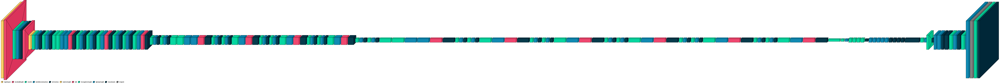

In [22]:

color_map = defaultdict(dict)
color_map[Dropout]['fill'] = 'gray'

font = ImageFont.truetype("/kaggle/input/quicksand/Quicksand-Medium.ttf", 32)
visualkeras.layered_view(deeplabv3plus, legend=True, font=None, to_file='/kaggle/working/deeplabv3plus_unet_architecture.png', color_map=color_map, draw_volume=True)

# DeepLabv3+ model training


In [23]:
def exponential_decay(lr0, s):
    def exponential_decay_fn(epoch):
        return lr0 * 0.1 **(epoch / s)
    return exponential_decay_fn

exponential_decay_fn = exponential_decay(0.0001, 40)

lr_scheduler = LearningRateScheduler(
    exponential_decay_fn,
    verbose=1
)

checkpoint = ModelCheckpoint(
    filepath = './output/deeplabv3plus.h5',
    save_best_only = True, 
#     save_weights_only = False,
    monitor = 'val_loss', 
    mode = 'auto', 
    verbose = 1
)

# earlystop = EarlyStopping(
#     monitor = 'val_loss', 
#     min_delta = 0.001, 
#     patience = 10, 
#     mode = 'auto', 
#     verbose = 1,
#     restore_best_weights = True
# )

csvlogger = CSVLogger(
    filename= "./output/deeplabv3plus_training.csv",
    separator = ",",
    append = False
)

callbacks = [checkpoint, csvlogger, lr_scheduler]



In [24]:
steps_per_epoch=30
# Instantiate generators
train_generator = TrainAugmentGenerator(train_images_dir=train_images, train_masks_dir=train_masks, target_size=(128, 128))
val_generator = ValAugmentGenerator(val_images_dir=val_images, val_masks_dir=val_masks, target_size=(128, 128))

# Fit the model using generators
history_1 = deeplabv3plus.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    validation_data=val_generator,
    validation_steps=validation_steps,
    epochs=50,
    callbacks=callbacks,
    use_multiprocessing=False,
    verbose=1
)


Found 7128 images belonging to 1 classes.
Found 7128 images belonging to 1 classes.

Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/50


2024-02-26 19:40:53.074021: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape ingradient_tape/model/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
I0000 00:00:1708976457.897130     105 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


30/30 [==============================] - ETA: 0s - loss: 1.2327 - dice_coef: 0.4874 - accuracy: 0.5970Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.

Epoch 1: val_loss improved from inf to 2.85956, saving model to ./output/deeplabv3plus.h5


/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


30/30 [==============================] - 44s 364ms/step - loss: 1.2327 - dice_coef: 0.4874 - accuracy: 0.5970 - val_loss: 2.8596 - val_dice_coef: 0.1742 - val_accuracy: 0.1704 - lr: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.440608762859235e-05.
Epoch 2/50
30/30 [==============================] - ETA: 0s - loss: 0.7668 - dice_coef: 0.6595 - accuracy: 0.7604
Epoch 2: val_loss did not improve from 2.85956
30/30 [==============================] - 6s 219ms/step - loss: 0.7668 - dice_coef: 0.6595 - accuracy: 0.7604 - val_loss: 10.7380 - val_dice_coef: 0.1386 - val_accuracy: 0.1390 - lr: 9.4406e-05

Epoch 3: LearningRateScheduler setting learning rate to 8.912509381337456e-05.
Epoch 3/50
30/30 [==============================] - ETA: 0s - loss: 0.6990 - dice_coef: 0.6841 - accuracy: 0.7838
Epoch 3: val_loss did not improve from 2.85956
30/30 [==============================] - 6s 206ms/step - loss: 0.6990 - dice_coef: 0.6841 - accuracy: 0.7838 - val_loss: 15.5140 - v

In [25]:
with open('./output/trainHistoryDict_deeplabv3plus', 'wb') as file_pi:
    pickle.dump(history_1.history, file_pi)

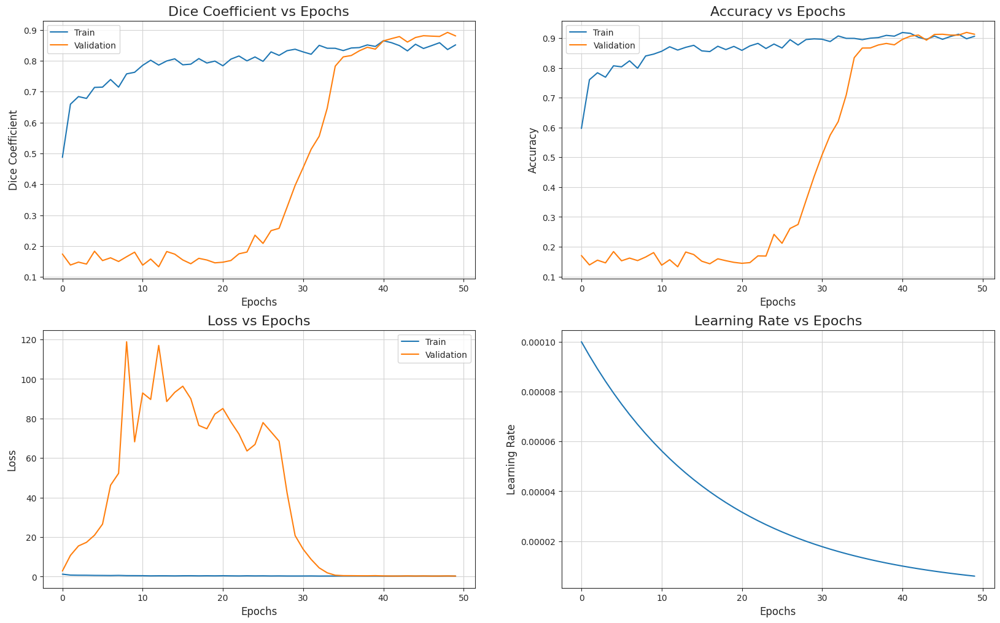

In [26]:

fig, ax = plt.subplots(2, 2, figsize=(20, 12))
ax = ax.ravel()
sns.set_style("ticks")
metrics = ['Dice Coefficient', 'Accuracy', 'Loss', 'Learning Rate']

for i, met in enumerate(['dice_coef', 'accuracy', 'loss', 'lr']): 
    if met != 'lr':
        ax[i].plot(history_1.history[met], '-')
        ax[i].plot(history_1.history['val_' + met], '-')
        ax[i].set_title('{} vs Epochs'.format(metrics[i]), fontsize=16)
        ax[i].set_xlabel('Epochs', fontsize=12)
        ax[i].set_ylabel(metrics[i], fontsize=12)
#         ax[i].set_xticks(np.arange(0,100,4))
        ax[i].legend(['Train', 'Validation'])
        ax[i].xaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
        ax[i].yaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
    else:
        ax[i].plot(history_1.history[met], '-')
        ax[i].set_title('{} vs Epochs'.format(metrics[i]), fontsize=16)
        ax[i].set_xlabel('Epochs', fontsize=12)
        ax[i].set_ylabel(metrics[i], fontsize=12)
#         ax[i].set_xticks(np.arange(0,100,4))
        ax[i].xaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
        ax[i].yaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
        
plt.savefig('/kaggle/working/deeplabv3plus_metrics_plot.png', facecolor= 'w',transparent= False, bbox_inches= 'tight', dpi= 300)

In [27]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

# Evaluating DeepLabV3+ Model on Test Set


In [28]:
testing_gen = TestAugmentGenerator(test_images_dir = test_images, test_masks_dir = test_masks, batch_size = 32, target_size = (128, 128))
deeplabv3plus.load_weights("/kaggle/working/output/deeplabv3plus.h5")
deeplabv3plus_eval = deeplabv3plus.evaluate(testing_gen, steps=21, return_dict=True)
scores = {
    'deeplabv3plus': {},
    'vgg16_unet': {},
    'mobilenetv2_unet' : {}
}
scores['deeplabv3plus'] = deeplabv3plus_eval

Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
21/21 [==============================] - 15s 418ms/step - loss: 0.1777 - dice_coef: 0.9072 - accuracy: 0.9407


In [29]:
Y_true_all_1, y_pred_all_1 = np.array([]), np.array([])
count = 0

for i in range(21):
    batch_img, batch_mask = next(testing_gen)
    pred_all= deeplabv3plus.predict(batch_img)
    
    for j in range(0,np.shape(pred_all)[0]):
        count += 1
        true_msk = batch_mask[j]
        pred_msk = pred_all[j]
        Y_true = np.argmax(true_msk, axis=-1) # Convert one-hot to index
        y_pred = np.argmax(pred_msk, axis=-1) # Convert one-hot to index

        Y_true_flat = Y_true.flatten()
        y_pred_flat = y_pred.flatten()
            
        Y_true_all_1 = np.append(Y_true_all_1, Y_true_flat)
        y_pred_all_1 = np.append(y_pred_all_1, y_pred_flat)

1/1 [==============================] - 0s 24ms/step


In [30]:
print(Y_true_all_1.shape, y_pred_all_1.shape)
print(classification_report(Y_true_all_1, y_pred_all_1))

(10928128,) (10928128,)


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         0.0       0.93      0.99      0.96   1150546
         1.0       0.82      0.90      0.86    869366
         2.0       0.91      0.86      0.88   1731271
         3.0       0.92      0.92      0.92   2166564
         4.0       0.96      0.95      0.95   1939606
         5.0       1.00      1.00      1.00   3070750
         6.0       0.00      0.00      0.00        25

    accuracy                           0.94  10928128
   macro avg       0.79      0.80      0.80  10928128
weighted avg       0.94      0.94      0.94  10928128



/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [31]:
print('Accuracy:', accuracy_score(Y_true_all_1, y_pred_all_1))
print('Precision:', precision_score(Y_true_all_1, y_pred_all_1, average='weighted'))
print('Recall:', recall_score(Y_true_all_1, y_pred_all_1, average='weighted'))
print('F1 Score:', f1_score(Y_true_all_1, y_pred_all_1, average='weighted'))

Accuracy: 0.9412681659658452


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision: 0.9418723951491648
Recall: 0.9412681659658452
F1 Score: 0.941253129705516


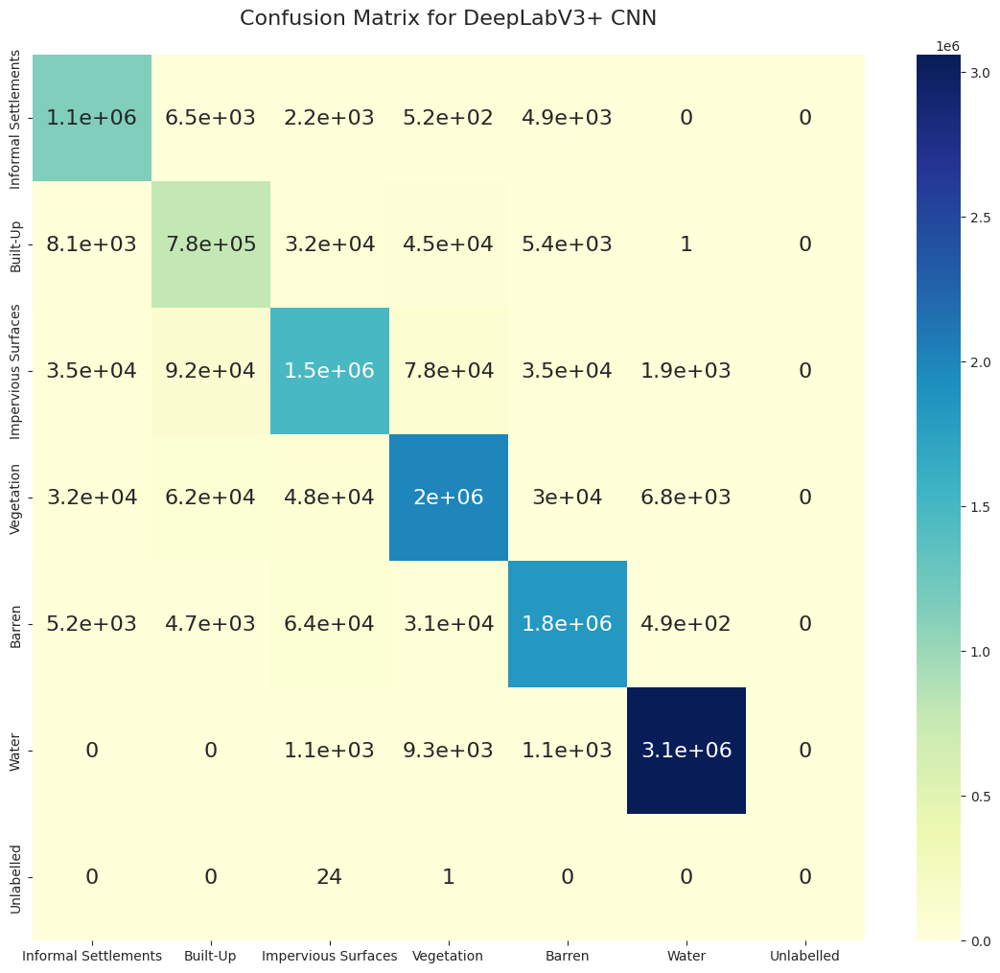

In [32]:
cm_1 = confusion_matrix(Y_true_all_1, y_pred_all_1)
df_cm_1 = pd.DataFrame(cm_1, label_names, label_names)
fig, ax = plt.subplots(figsize=(14,12))
# sns.set(font_scale=1.4) # for label size
sns.heatmap(df_cm_1, annot=True, annot_kws={"size": 16}, cmap=plt.cm.YlGnBu)
plt.title('Confusion Matrix for DeepLabV3+ CNN\n', fontsize=16)
plt.savefig('/kaggle/working/confusion_matrix_1.png', transparent= False, bbox_inches= 'tight', dpi= 300)
plt.show()

In [33]:
per_class_iou_1 = iou(cm_1)
per_class_iou_1


array([0.92302175, 0.75229359, 0.79289401, 0.85309544, 0.91042605,
       0.99329267, 0.        ])

In [34]:
per_class_acc_1 = class_accuracy(cm_1)
per_class_acc_1

array([0.98771974, 0.89539158, 0.86036097, 0.91744486, 0.94605863,
       0.99625727, 0.        ])

In [35]:
deeplabv3plus_class_acc = pd.DataFrame(zip(label_names, per_class_acc_1[:6].T), columns=['Class', 'Accuracy'])
deeplabv3plus_class_acc['F1'] = f1_score(Y_true_all_1, y_pred_all_1, average=None)[:6]
deeplabv3plus_class_acc

,Class,Accuracy,F1
0,Informal Settlements,0.987720,0.959970
1,Built-Up,0.895392,0.858639
2,Impervious Surfaces,0.860361,0.884485
3,Vegetation,0.917445,0.920725
4,Barren,0.946059,0.953113
5,Water,0.996257,0.996635


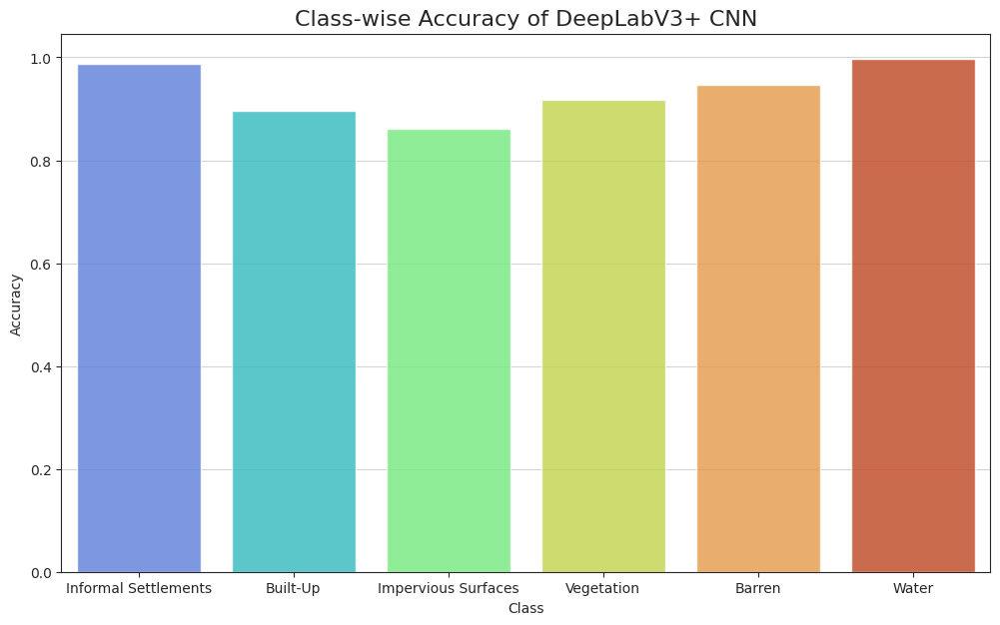

In [36]:
plt.figure(figsize=(12, 7))
plt.title('Class-wise Accuracy of DeepLabV3+ CNN', fontsize=16)
sns.set_style("ticks")
sns.barplot(x="Class", y="Accuracy", data=deeplabv3plus_class_acc, palette='turbo', alpha = 0.8)
plt.grid(axis='y', color = 'lightgray', linestyle='-', linewidth=0.8)
plt.savefig('/kaggle/working/deeplabv3plus_class_acc.png', facecolor= 'w', transparent= False, bbox_inches= 'tight', dpi= 300)
plt.show()

# Predictions on Test Set Using DeepLabV3+ Model


In [37]:
!mkdir deeplabv3plus_pred

1/1 [==============================] - 0s 30ms/step


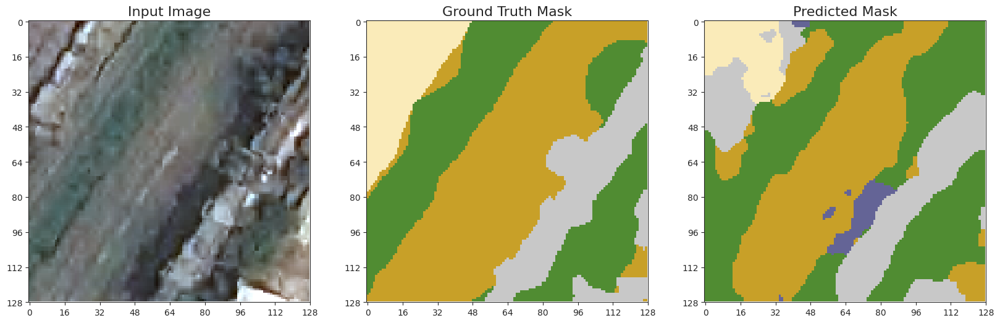

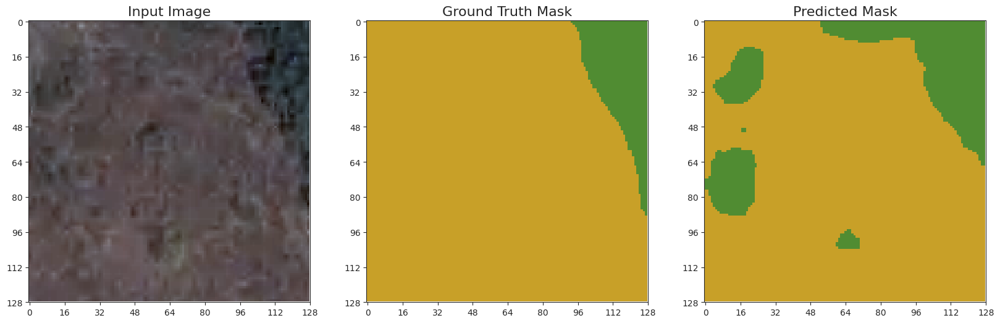

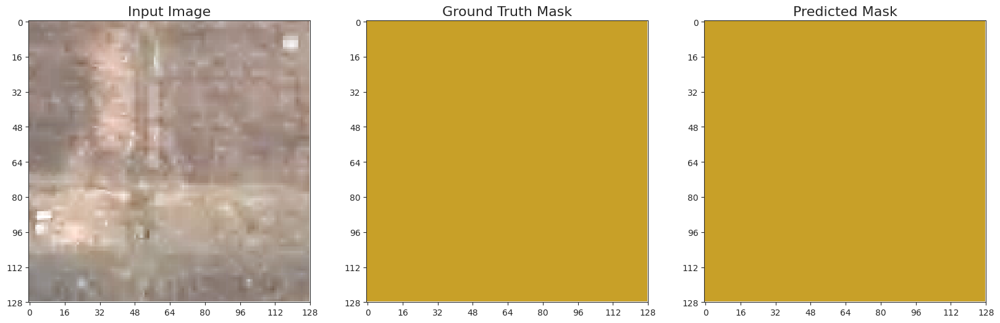

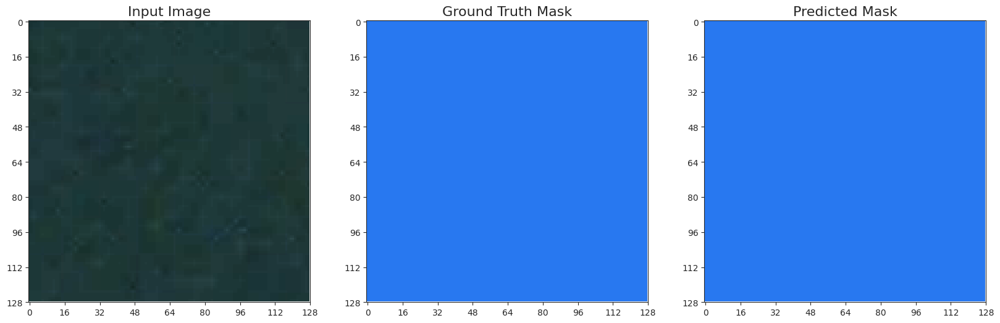

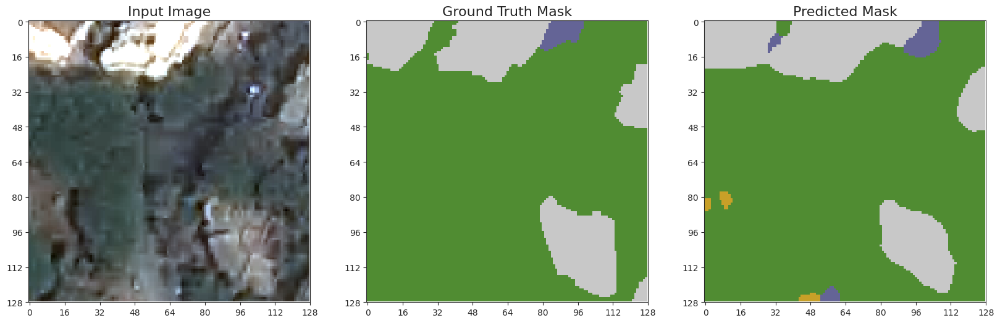

...

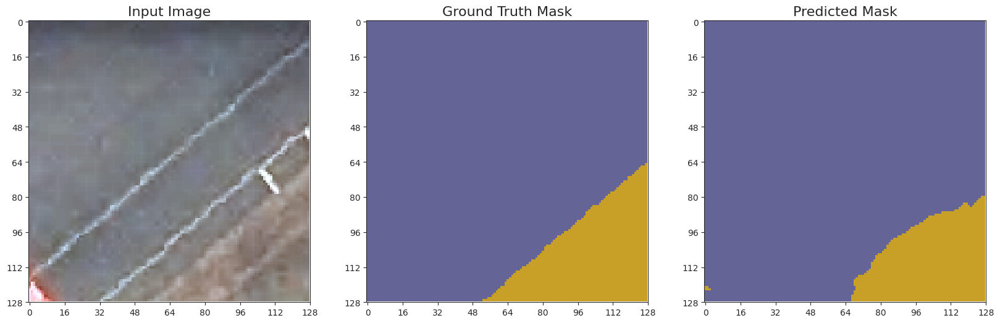

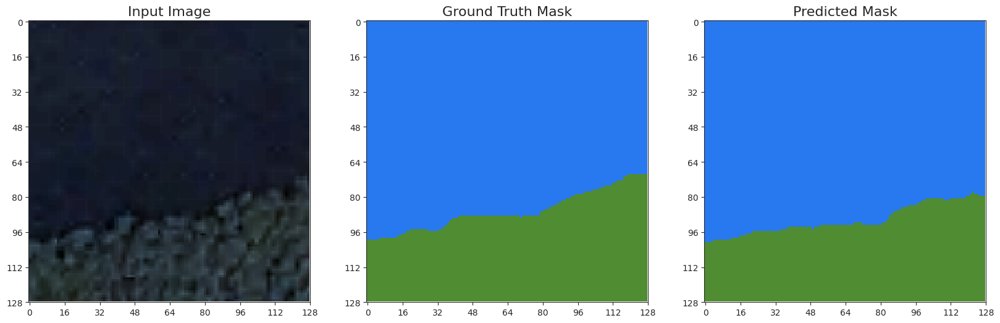

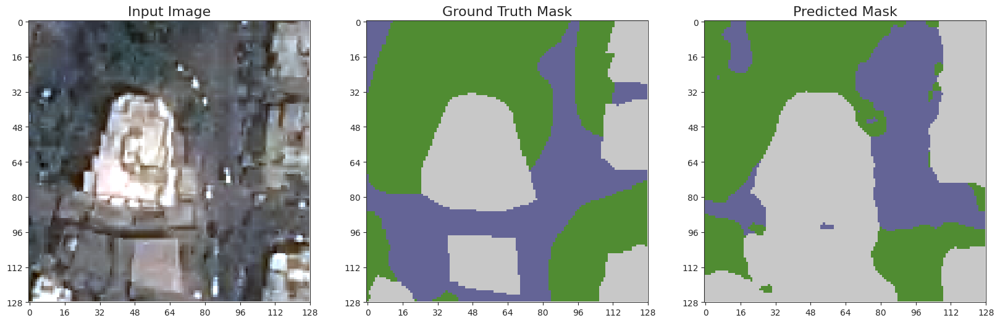

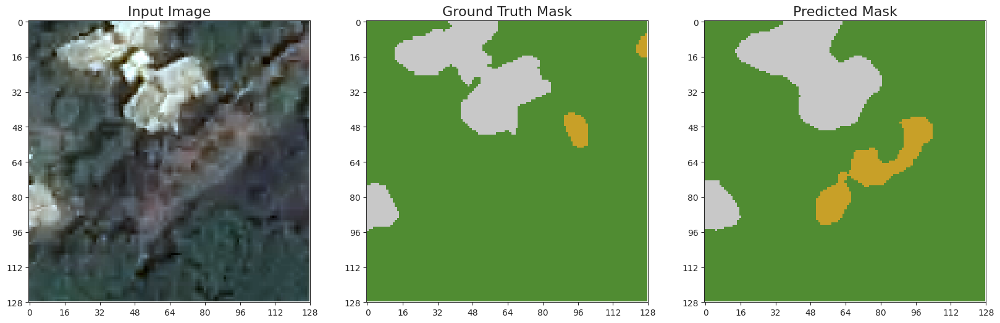

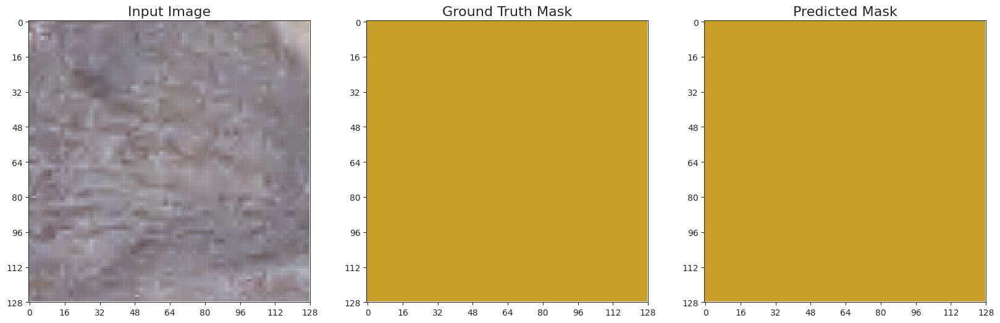

1/1 [==============================] - 0s 25ms/step


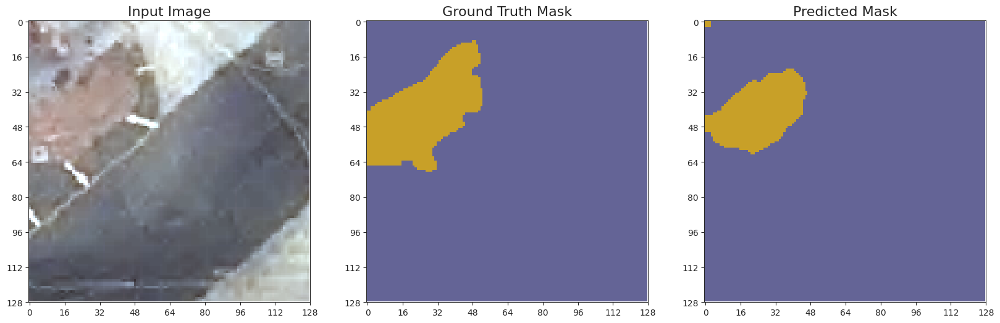

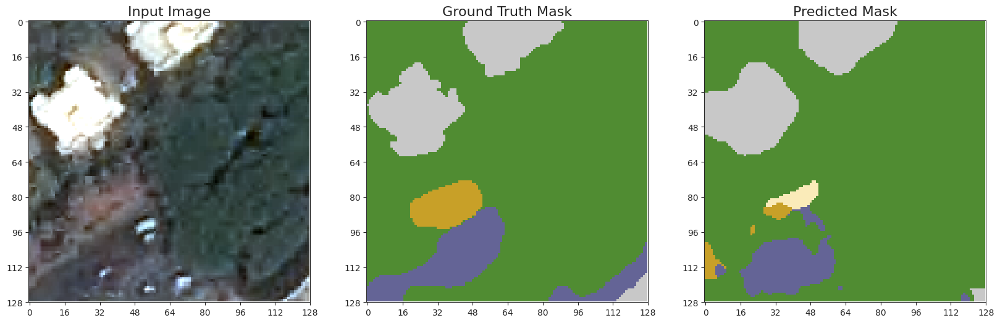

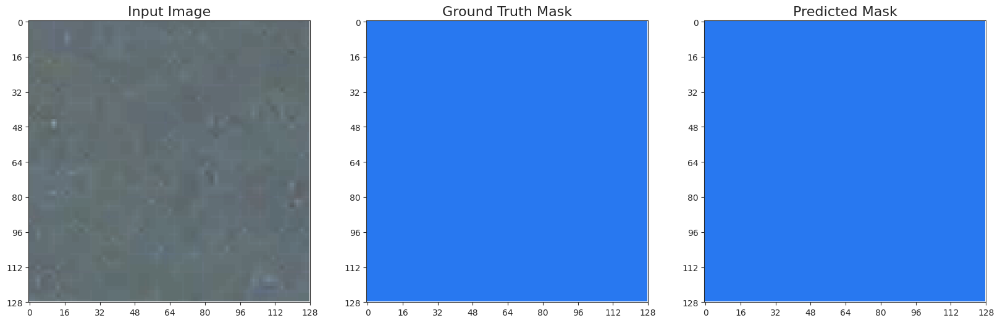

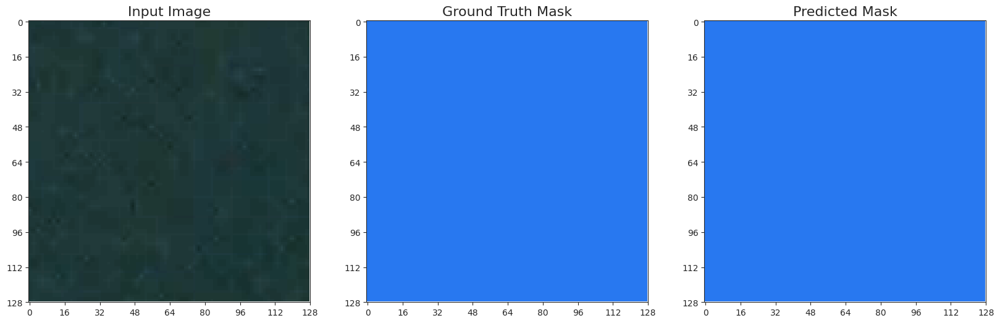

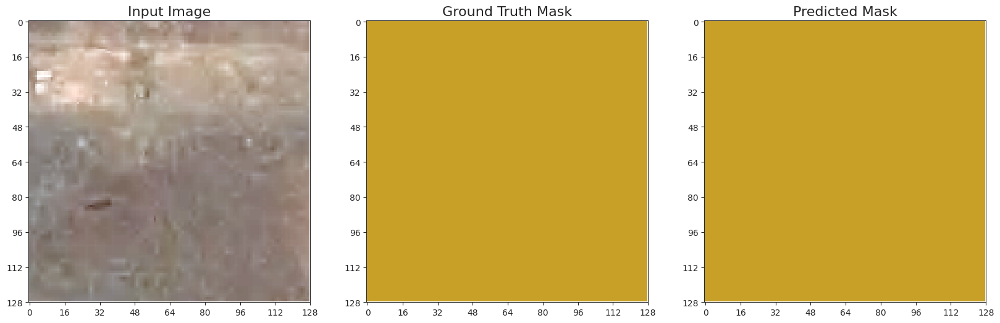

...

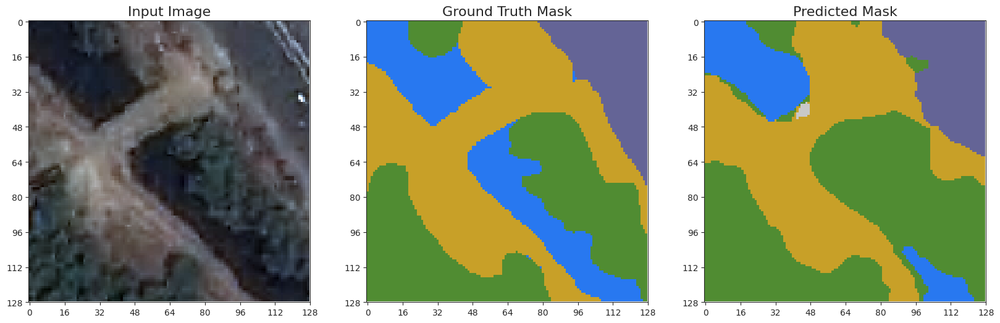

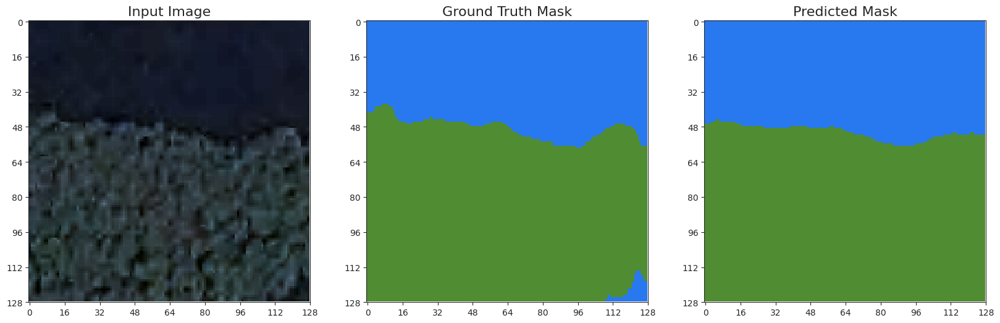

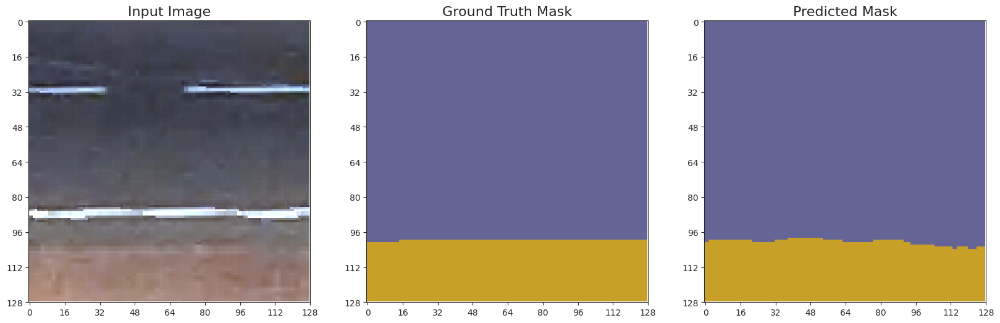

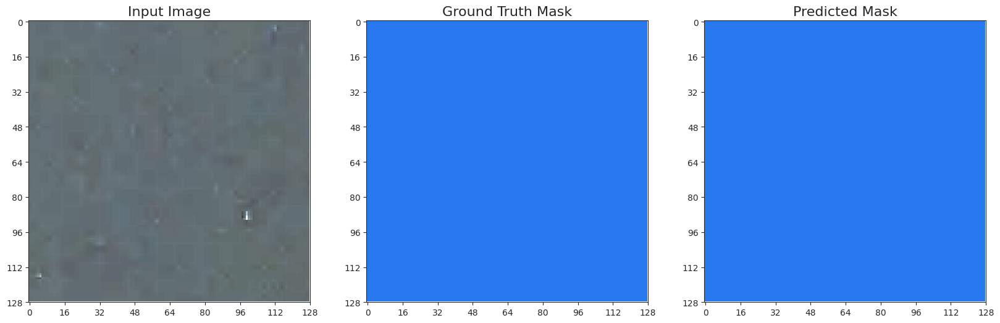

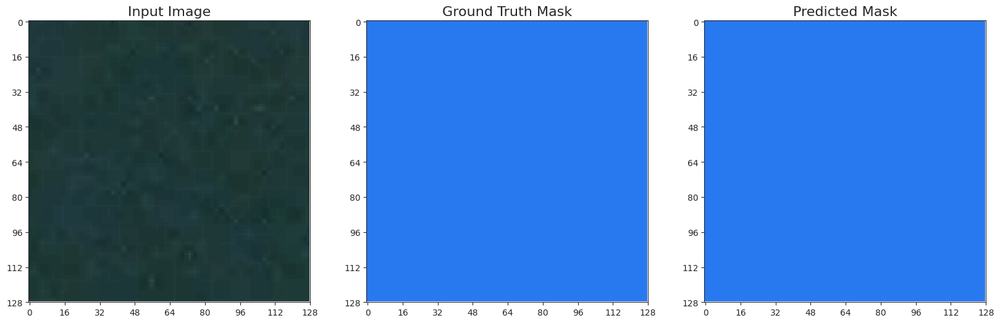

1/1 [==============================] - 0s 29ms/step


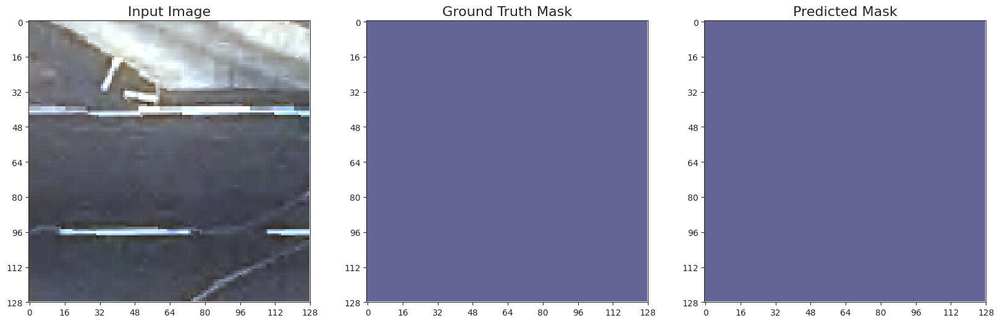

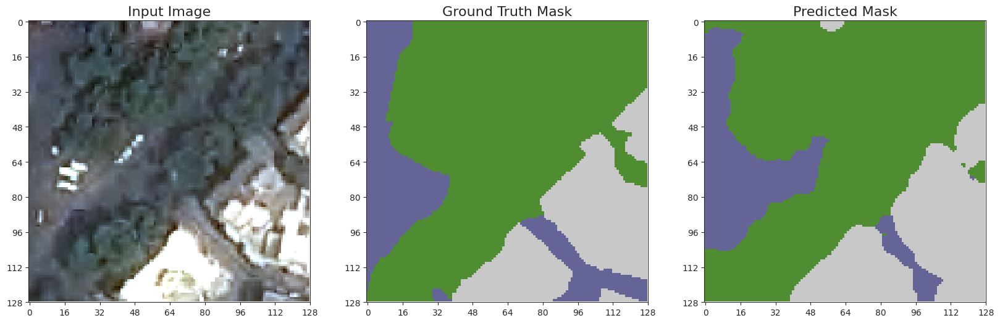

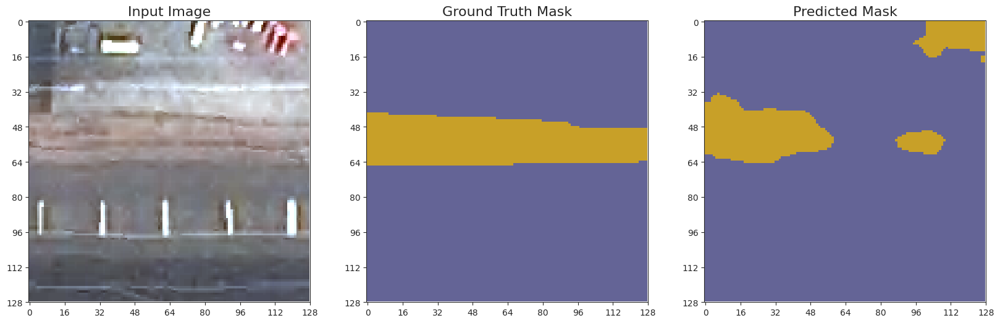

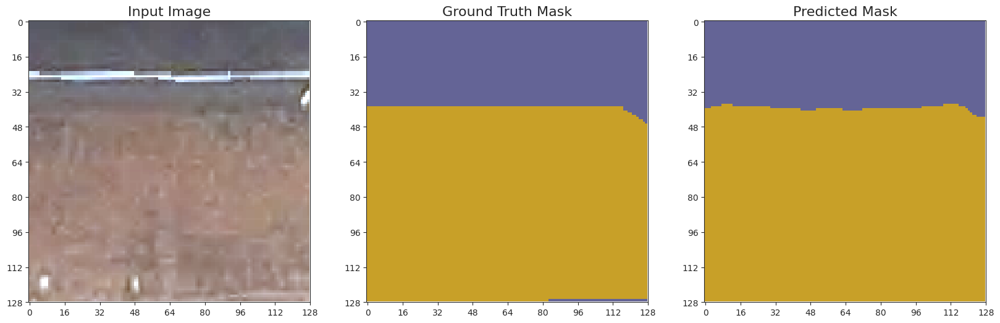

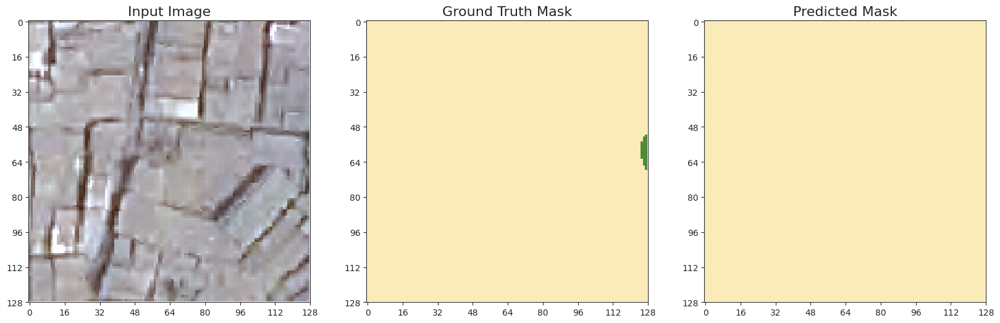

...

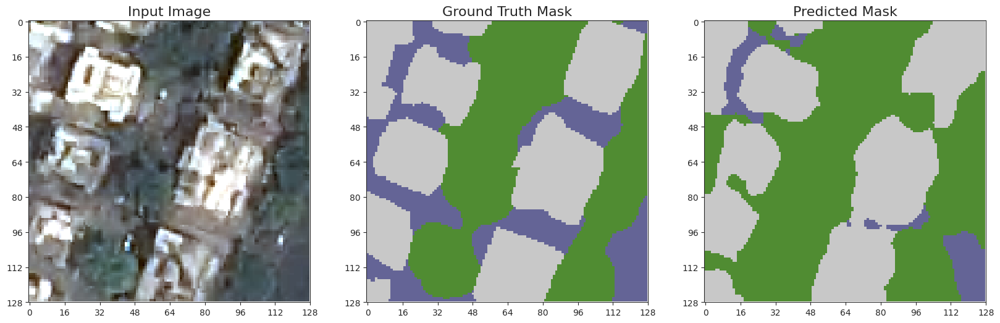

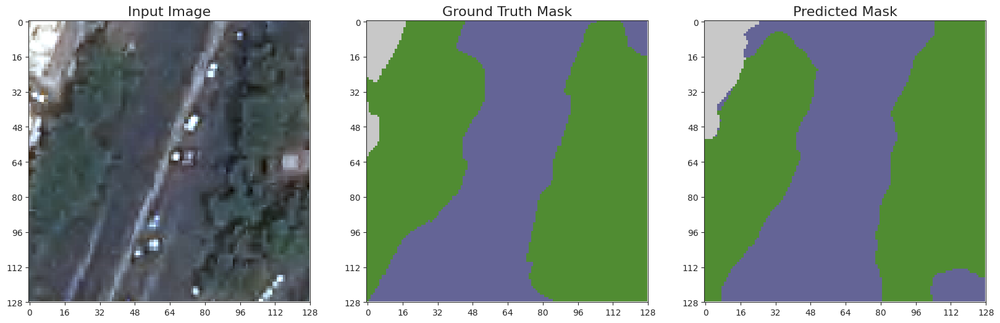

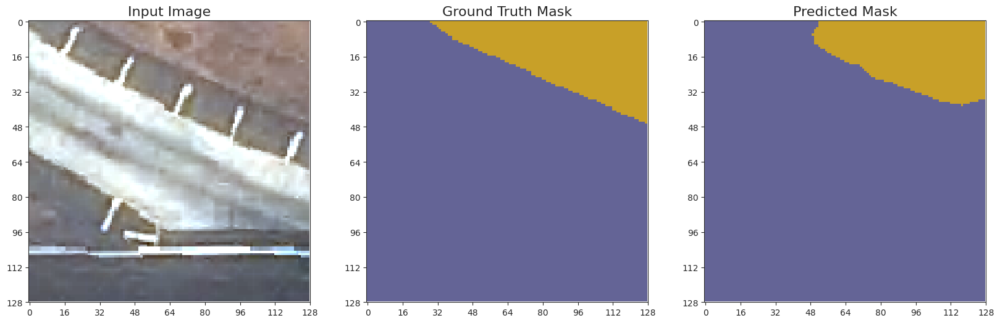

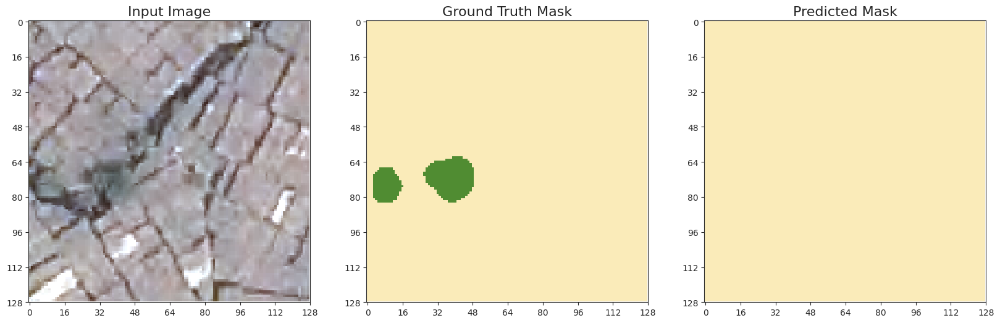

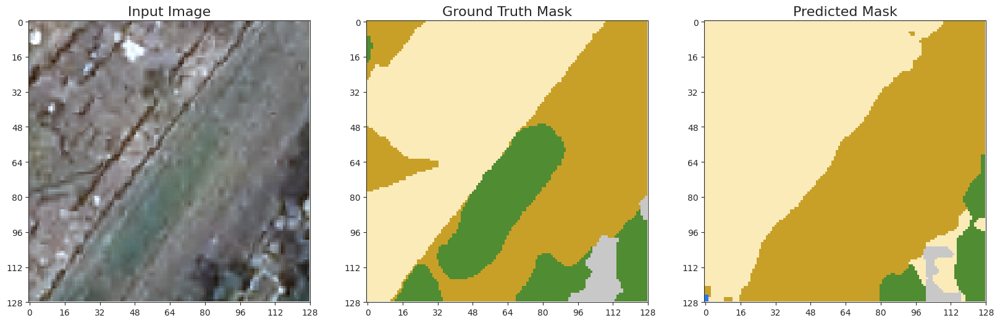

1/1 [==============================] - 0s 26ms/step


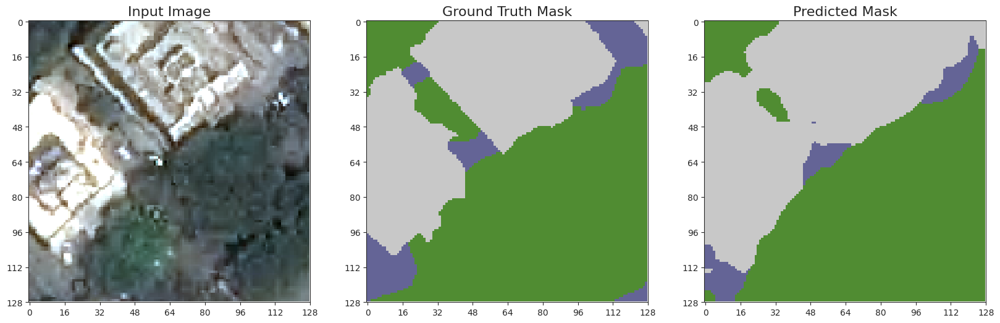

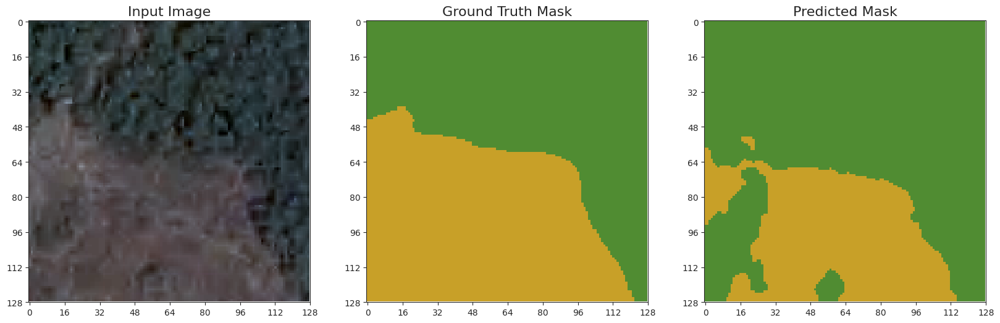

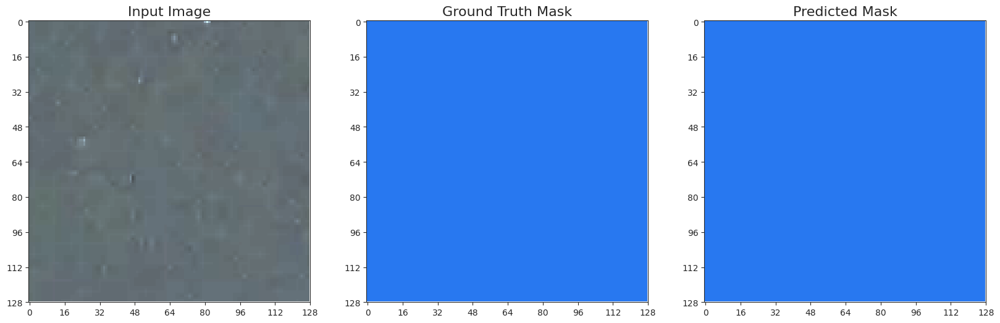

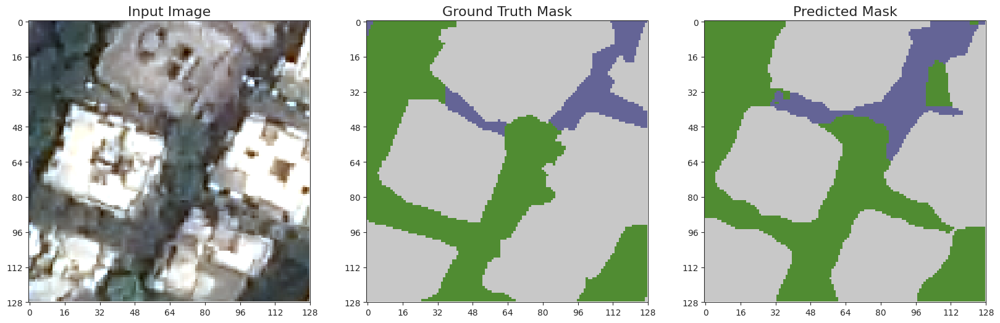

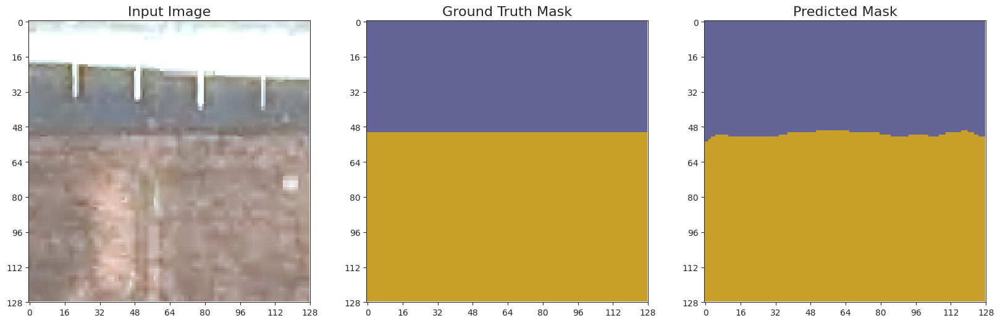

...

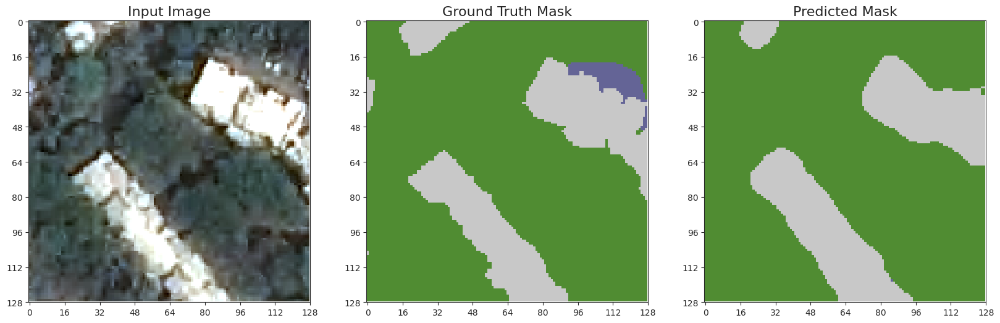

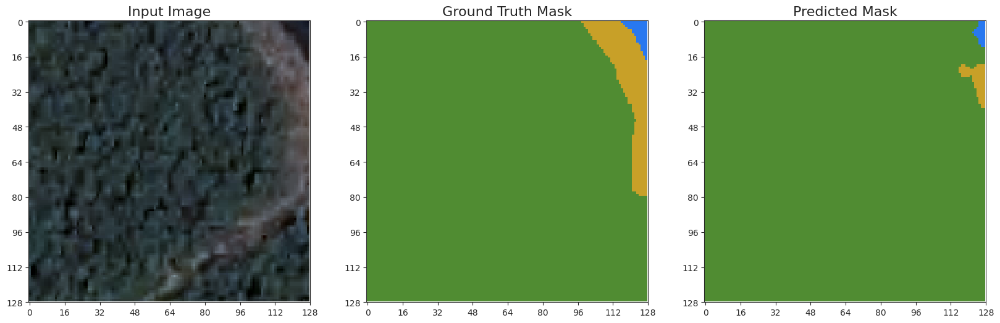

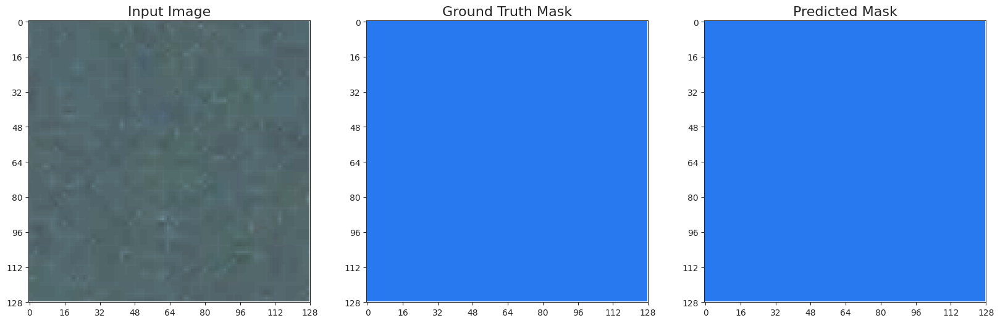

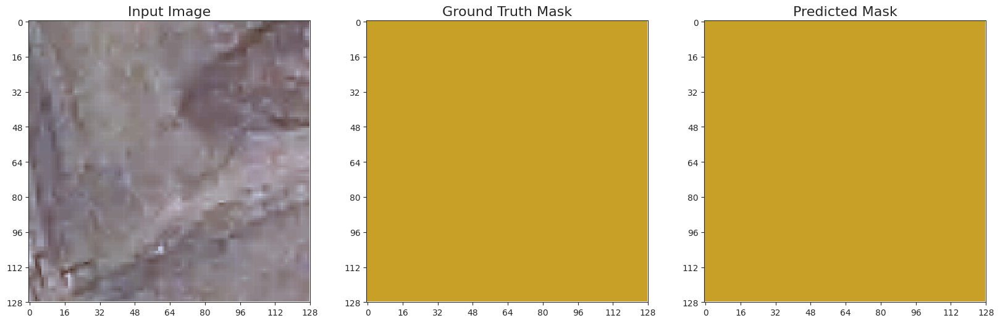

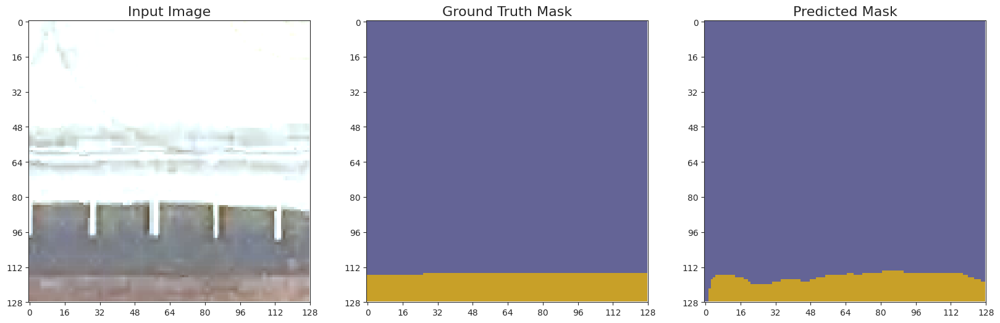

1/1 [==============================] - 0s 27ms/step


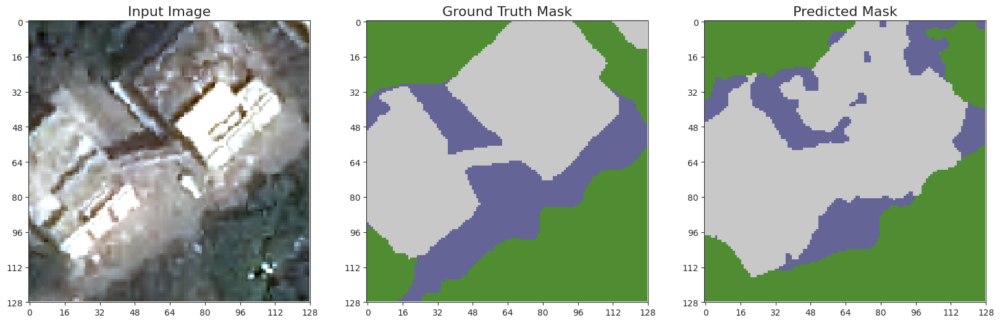

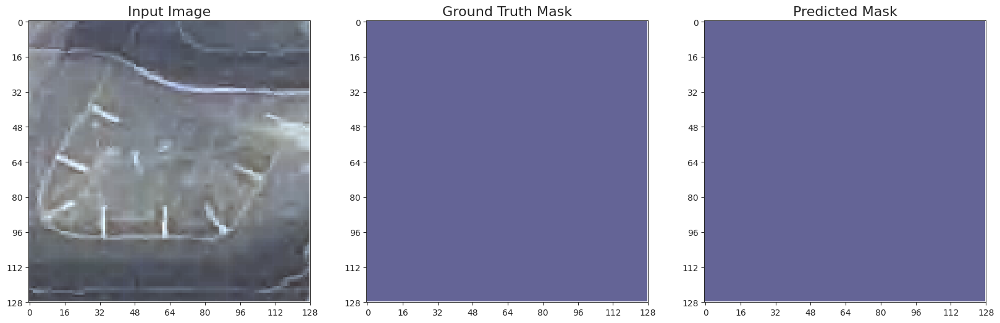

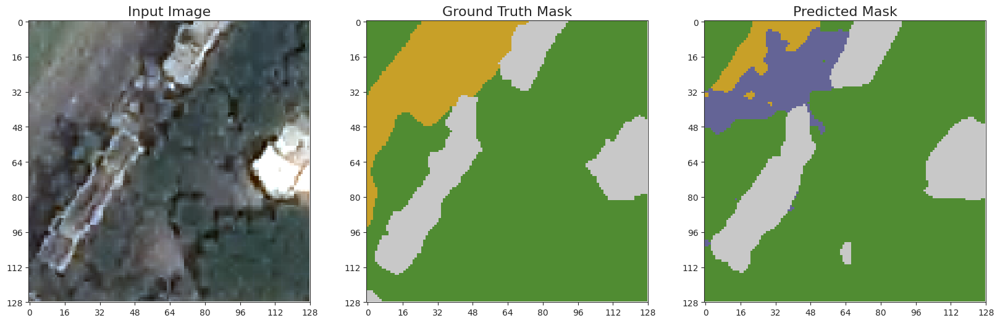

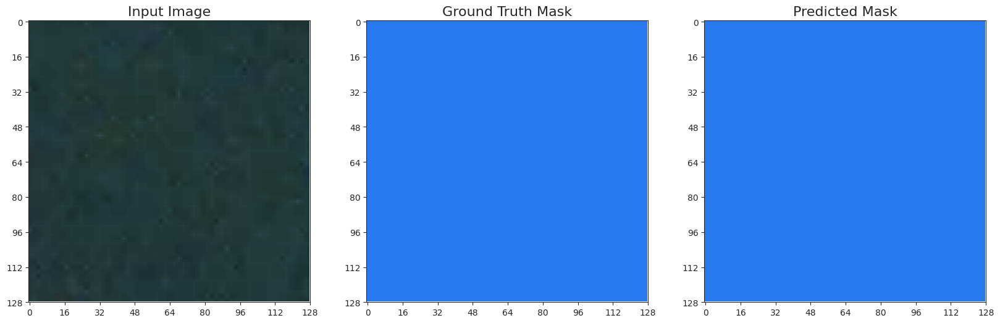

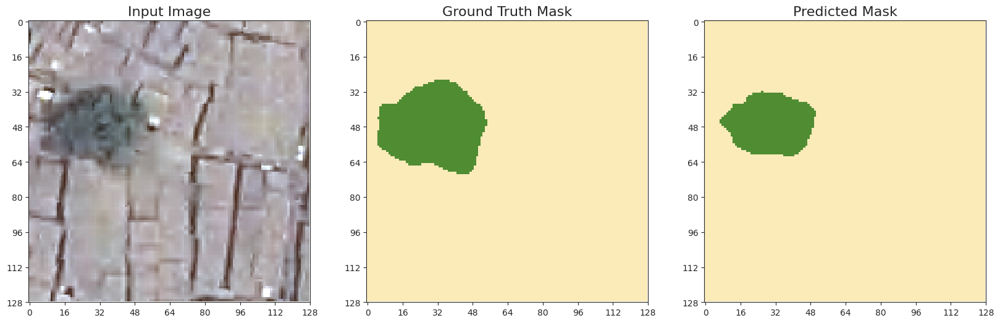

...

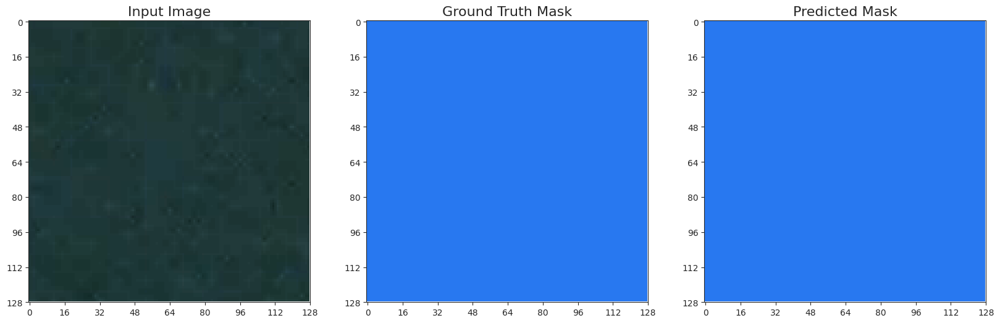

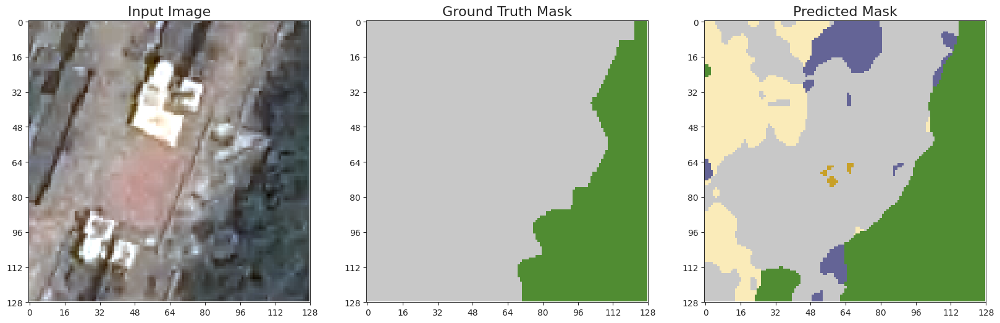

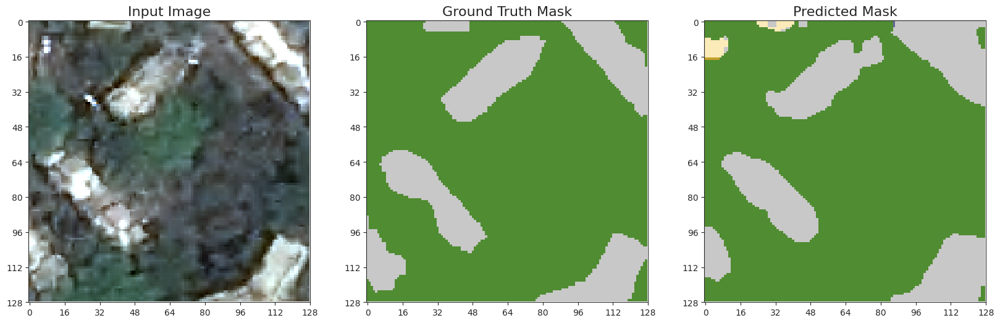

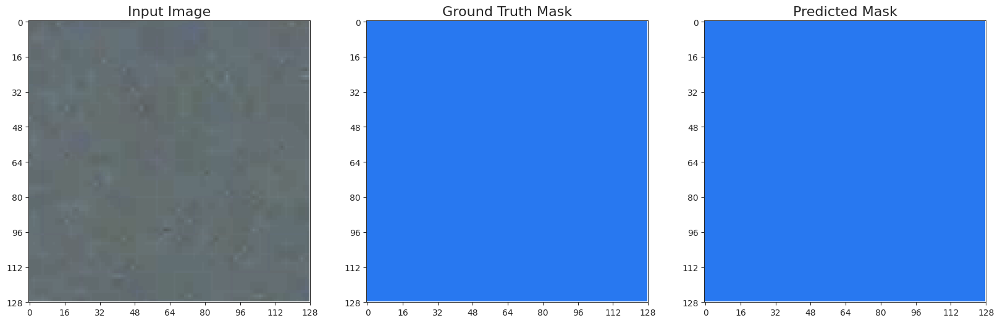

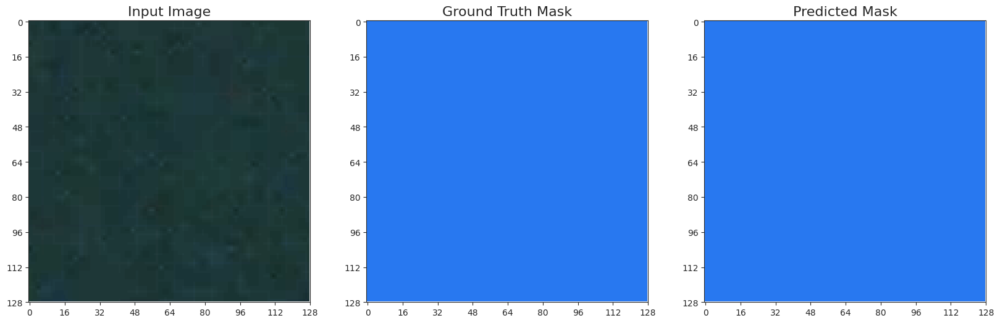

In [38]:
count = 0
for i in range(5):
    batch_img,batch_mask = next(testing_gen)
    pred_all= deeplabv3plus.predict(batch_img)
    np.shape(pred_all)
    
    for j in range(0,np.shape(pred_all)[0]):
        count += 1
        fig = plt.figure(figsize=(20,8))

        ax1 = fig.add_subplot(1,3,1)
        ax1.imshow(batch_img[j])
        ax1.set_title('Input Image', fontdict={'fontsize': 16, 'fontweight': 'medium'})
        ax1.set_xticks(np.arange(0, 129, 16))
        ax1.set_yticks(np.arange(0, 129, 16))
        ax1.grid(False)

        ax2 = fig.add_subplot(1,3,2)
        ax2.set_title('Ground Truth Mask', fontdict={'fontsize': 16, 'fontweight': 'medium'})
        ax2.imshow(onehot_to_rgb(batch_mask[j],id_to_code))
        ax2.set_xticks(np.arange(0, 129, 16))
        ax2.set_yticks(np.arange(0, 129, 16))
        ax2.grid(False)

        ax3 = fig.add_subplot(1,3,3)
        ax3.set_title('Predicted Mask', fontdict={'fontsize': 16, 'fontweight': 'medium'})
        ax3.imshow(onehot_to_rgb(pred_all[j],id_to_code))
        ax3.set_xticks(np.arange(0, 129, 16))
        ax3.set_yticks(np.arange(0, 129, 16))
        ax3.grid(False)

        plt.savefig('/kaggle/working/deeplabv3plus_pred/deeplabv3plus_pred_{}.png'.format(count), facecolor= 'w', transparent= False, bbox_inches= 'tight', dpi= 200)
        plt.show()